In [1]:
from datetime import datetime,timedelta
import requests
import logging
from typing import List, Dict
import os
import ScraperFC as sfc  # LEAVE THIS!
import pandas as pd
from tqdm import tqdm
import time
import logging
import pickle
from datetime import datetime
import math
from helpers import generate_custom_date_range, fetch_data, fetch_scheduled_events, convert_percentage

In [2]:
teams_df = pd.read_csv('team_statistics.csv')

In [96]:
LEAGUES = {
    "EPL":17,
    "La Liga":8,
    "Liga Portugal Betclic":238,
    "Ligue 1":34,
    "Bundesliga":35,
    'Serie A':23,
    "Champions League":7,
    "brasileirao-serie-a":325,
    "MLS":242,
    "championship":18,
    'Europa League':679,
    'Copa Del Rey' :329,
    'EFL Cup':21,
}

In [4]:
# Dictionary to store player ELO ratings
player_elo_csv = 'player_elo_data.csv'
team_elo_csv = 'team_elo_data.csv'


if os.path.exists(player_elo_csv):
    player_elo_df = pd.read_csv(player_elo_csv, index_col='player_id')
else:
    # Initialize an empty DataFrame with 'player_id' as the index
    player_elo_df = pd.DataFrame(columns=['player_name', 'team_id', 'elo', 'last_updated'])
    player_elo_df.index.name = 'player_id'  # Set the index name to 'player_id'

if os.path.exists(team_elo_csv):
    team_elo_df = pd.read_csv(team_elo_csv)
else:
    team_elo_df = pd.DataFrame(columns=['team_id', 'team_name', 'team_elo', 'last_updated'])


In [5]:
def initialize_player_elo(player_id, player_name, team_id, position, elo, date):
    """
    Initialize or update a player's ELO rating in the DataFrame.

    Parameters:
    - player_id (int/str): Unique identifier for the player.
    - player_name (str): Name of the player.
    - team_id (int/str): Identifier for the player's team.
    - elo (float): Current or new ELO rating of the player.
    - date (str): Date when the ELO was last updated (YYYY-MM-DD).
    """

    if player_id in player_elo_df.index:
        # Update existing player's ELO and last_updated date
        player_elo_df.at[player_id, 'elo'] = elo
        player_elo_df.at[player_id, 'position'] = position
        player_elo_df.at[player_id, 'last_updated'] = date
        logging.debug(f"Updated ELO for player ID: {player_id} to {elo}.")
    else:
        # Add new player to the DataFrame
        player_elo_df.loc[player_id] = {
            'player_name': player_name,
            'team_id': team_id,
            'positions': position,
            'elo': elo,
            'last_updated': date
        }
        #logging.info(f"Added new player to DataFrame: {player_id} - {player_name} with ELO {elo}.")


In [6]:
def initialize_team_elo(team_id, team_name, elo=1500, date=None):
    """
    Initialize or update a team's ELO rating in the DataFrame.

    Parameters:
    - team_id (int/str): Unique identifier for the team.
    - team_name (str): Name of the team.
    - elo (float): Current or new ELO rating of the team (default is 1500).
    - date (str): Date when the ELO was last updated (YYYY-MM-DD).
    """

    if team_id in team_elo_df.index:
        # Update existing team's ELO and last_updated date
        team_elo_df.at[team_id, 'elo'] = elo
        team_elo_df.at[team_id, 'last_updated'] = date
        logging.debug(f"Updated ELO for team ID: {team_id} to {elo}.")
    else:
        # Add new team to the DataFrame
        team_elo_df.loc[team_id] = {
            'team_name': team_name,
            'elo': elo,
            'last_updated': date
        }
        logging.info(f"Added new team to DataFrame: {team_id} - {team_name} with ELO {elo}.")


In [ ]:
def aggregate_team_elo(team_id, match_player_data):
    """
    Calculate the average ELO for a team based on its players.

    Parameters:
    - team_id (int/str): Identifier for the team.
    - match_player_data (pd.DataFrame): DataFrame containing player match data.
      Expected columns: ['id', 'teamId', 'substitute', ...]

    Returns:
    - float: Average ELO of the team.
    """

    # Filter players belonging to the team and not substitutes
    team_players = match_player_data[
        (match_player_data['teamId'] == team_id) & 
        (match_player_data['substitute'] == False)
    ]
    # Extract player IDs from the filtered players
    player_ids = team_players['id'].tolist()

    # Retrieve ELO ratings from the DataFrame for these player IDs
    # Assuming 'player_id' in player_elo_df corresponds to 'id' in match_player_data
    team_elos = player_elo_df.loc[player_ids, 'elo'].tolist()
    #print(team_elos)
    # Calculate and return the average ELO, or default if no players found
    if len(team_elos) > 0:
        average_elo = sum(team_elos) / len(team_elos)
        logging.debug(f"Aggregated ELO for team ID {team_id}: {average_elo}")
        return average_elo
    else:
        logging.warning(f"No ELO data found for team ID {team_id}. Using default ELO 1300.")
        return 1300  # Default ELO if no players found


In [ ]:
def update_player_elo(agg_elo_home, agg_elo_away,
                      total_home_wins, total_away_wins, total_matches,
                      gd,
                      player_id,
                      rating,
                      minutes_played,
                      position,
                      U=0.8,
                      K=30,
                      sc=600,
                      away=False):
    """
    Update player ELO based on their performance, minutes played, and match outcome.
    outcome: 1 for win, 0 for draw, -1 for loss
    """
    
    
    
    if pd.isna(rating) or pd.isna(minutes_played) or minutes_played == 0:
        return

        
    mov = max(1, math.log2(abs(gd) + 1))
    performance_factor = rating / 10  # Normalize rating (assuming it's out of 10)
    time_factor = minutes_played / 90  # Weight based on minutes played
    f_home = (total_home_wins + 0.5) / (total_matches + 1)
    f_away = (total_away_wins + 0.5) / (total_matches + 1)
    H = math.log10(f_home / f_away)
        
    R_h = player_elo_df.loc[player_id, 'elo']
    R_a = agg_elo_away
    
    

    
    if away == True:
        R_h = agg_elo_home
        R_a = player_elo_df.loc[player_id, 'elo']
        
    if gd>0:
        s = 1
    if gd == 0:
        s = 0.5
    if gd<0:
        s=0

    
    D = R_h - R_a + H * sc
    numerator = math.pow(10, 0.5 * D / sc) + 0.5 * U
    denominator = math.pow(10, 0.5 * D / sc) + math.pow(10, -0.5 * D / sc) + U
    F_D = numerator / denominator
    s_away = 1 - s
    F_D_away = 1 - F_D
    
    
   # else:
   #     adjustment = K * (s_away - F_D_away) * mov * (performance_factor) * time_factor
    
    
    
    if gd > 0: 
        if away == False:
            adjustment = K * (s - F_D) * mov * performance_factor * time_factor
        else:
            adjustment = K * (s_away - F_D_away) * mov * (1 - performance_factor) * time_factor
                    
    elif gd == 0:
        if away == False:
            if R_h >= R_a:
                adjustment = K * (s - F_D) * mov * (1 - performance_factor) * time_factor  # Corrected
            else:
                adjustment = K * (s - F_D) * mov * performance_factor * time_factor
        else:
            if R_a > R_h:
                adjustment = K * (s_away - F_D_away) * mov * (1 - performance_factor) * time_factor
            else:
                adjustment = K * (s_away - F_D_away) * mov * performance_factor * time_factor
                        
    elif gd < 0:
        if away == True:
            adjustment = K * (s_away - F_D_away) * mov * performance_factor * time_factor
        else:
            adjustment = K * (s - F_D) * mov * (1 - performance_factor) * time_factor

    # Update player's ELO
    player_elo_df.loc[player_id, 'elo'] += adjustment
    player_elo_df.at[player_id, 'position'] = position


In [9]:
logging.basicConfig(level=logging.DEBUG)

In [15]:
with open('elo_ratings_mov.pkl', 'rb') as file:
    elo_ratings_mov = pickle.load(file)

In [10]:
elo_ratings_mov = {}

In [11]:
output_dir_players = 'playerperformances'
os.makedirs(output_dir_players, exist_ok=True)

output_dir_matches = 'matchstats'
os.makedirs(output_dir_matches, exist_ok=True)

In [12]:
ss = sfc.Sofascore()

In [13]:
tournament_ids = list(LEAGUES.values())
matches_data = []

In [14]:
total_home_wins,total_away_wins,total_matches=0,0,0

In [15]:

def davidson_mov(home_team,
                 away_team,
                 gd,
                 elo_dict,
                 total_home_wins, total_away_wins, total_matches,
                 U=0.8,
                 K=30,
                 sc=600):
    
    
    R_h = elo_dict[home_team]
    R_a = elo_dict[away_team]
    
    
    if gd>0:
        s=1
    elif gd<0:
        s=0
    elif gd==0:
        s=0.5
        
    gd = abs(gd)
    mov = max(1, math.log2(gd + 1))
    
     # Calculate frequencies with smoothing
    f_home = (total_home_wins + 0.5) / (total_matches + 1)
    f_away = (total_away_wins + 0.5) / (total_matches + 1)

    # Calculate H
    H = math.log10(f_home / f_away)
    
    # Calculate D with home advantage
    D = R_h - R_a + H * sc

    # Calculate F(D)
    numerator = math.pow(10, 0.5 * D / sc) + 0.5 * U
    denominator = math.pow(10, 0.5 * D / sc) + math.pow(10, -0.5 * D / sc) + U
    F_D = numerator / denominator

    # Rating changes
    elo_change_home = K * (s - F_D) * mov
    elo_dict[home_team] += elo_change_home

    # For the away team
    s_away = 1 - s
    F_D_away = 1 - F_D
    elo_change_away = K * (s_away - F_D_away) * mov
    elo_dict[away_team] += elo_change_away

    return R_h , R_a
    


In [16]:
H = 111

In [26]:
# Define the seasons and leagues
seasons = ['15/16', '16/17', '17/18', '18/19', '19/20', '20/21', '21/22', '22/23', '23/24', '24/25']
calendar_year_seasons = [str(year) for year in range(2015, 2025)]  # Use calendar years for MLS, Brasileirao

leagues = ['EPL', 'La Liga', 'liga-portugal-betclic', 'Ligue 1', 'Bundesliga', 'Serie A', 'Champions League', 'MLS', 'brasileirao-serie-a', 'championship', 'Europa League']

# Initialize a list to store all the match events
all_events = []

# Loop through each league
for league in leagues:
    try:
        # Check if the league uses calendar years
        if league in ['MLS', 'brasileirao-serie-a']:
            # Fetch match data using calendar year format
            for calendar_season in calendar_year_seasons:
                events = ss.get_match_dicts(calendar_season, league)
                all_events.extend(events)
                print(f"Successfully fetched data for {league} - {calendar_season}")
        else:
            # Fetch match data using 'XX/XX' format for European leagues
            for season in seasons:
                events = ss.get_match_dicts(season, league)
                all_events.extend(events)
                print(f"Successfully fetched data for {league} - {season}")

    except Exception as e:
        # Handle any exceptions that may occur during the fetching process
        print(f"Error fetching data for {league}: {e}")

# Now 'all_events' contains all the match data for the specified leagues and seasons


Successfully fetched data for EPL - 15/16
Successfully fetched data for EPL - 16/17
Successfully fetched data for EPL - 17/18
Successfully fetched data for EPL - 18/19
Successfully fetched data for EPL - 19/20
Successfully fetched data for EPL - 20/21
Successfully fetched data for EPL - 21/22
Successfully fetched data for EPL - 22/23
Successfully fetched data for EPL - 23/24
Successfully fetched data for EPL - 24/25
Successfully fetched data for La Liga - 15/16
Successfully fetched data for La Liga - 16/17
Successfully fetched data for La Liga - 17/18
Successfully fetched data for La Liga - 18/19
Successfully fetched data for La Liga - 19/20
Successfully fetched data for La Liga - 20/21
Successfully fetched data for La Liga - 21/22
Successfully fetched data for La Liga - 22/23
Successfully fetched data for La Liga - 23/24
Successfully fetched data for La Liga - 24/25
Successfully fetched data for liga-portugal-betclic - 15/16
Successfully fetched data for liga-portugal-betclic - 16/17


In [27]:
from datetime import datetime

# Sort the events list based on 'startTimestamp'
events_sorted = sorted(all_events, key=lambda x: x.get('startTimestamp', 0))

In [ ]:
events = events_sorted
count = 0
rating_sum = 0
rating_list = []
M_rating_list = []
F_rating_list = []
D_rating_list = []
G_rating_list = []


for event in tqdm(events, desc="Processing Events"):
        try:
            # Extract event details
            event_id = event.get("id", None)
            home_team = event.get('homeTeam', {}).get('name', 'Unknown')
            home_team_id = event.get('homeTeam', {}).get('id', 'Unknown')
            away_team = event.get('awayTeam', {}).get('name', 'Unknown')
            away_team_id = event.get('awayTeam', {}).get('id', 'Unknown')
            home_score = event.get('homeScore', {}).get('display', 0)
            away_score = event.get('awayScore', {}).get('display', 0)
            gd = home_score - away_score


            # Convert timestamp to readable date and time
            start_timestamp = event.get("startTimestamp")
            if start_timestamp:
                match_datetime = datetime.fromtimestamp(start_timestamp)
                match_date = match_datetime.strftime("%Y-%m-%d")
                match_time = match_datetime.strftime("%H:%M:%S")
            else:
                match_date = None
                match_time = None


            if home_team_id not in team_elo_df.index:
                initialize_team_elo(home_team_id, home_team, elo=1500, date=match_date)

            if away_team_id not in team_elo_df.index:
                initialize_team_elo(away_team_id, away_team, elo=1500, date=match_date)
            # Scrape player match stats
            
            match_player_data = ss.scrape_player_match_stats(event_id)

            # Aggregate team ELOs


            # Extract all player IDs in the match
           # Extract all player IDs in the match
            player_ids = match_player_data['id'].unique()

            # Identify missing player IDs
            missing_player_ids = [pid for pid in player_ids if pid not in player_elo_df.index]

            if missing_player_ids:
                # Extract details of missing players
                missing_players = match_player_data[match_player_data['id'].isin(missing_player_ids)]
                
                for _, player in missing_players.iterrows():
                    player_id = player['id']
                    player_name = player['name']
                    player_position = player['position']
                    team_id = player['teamId']
                    # Initialize missing player with default ELO of 1300
                    initialize_player_elo(player_id, player_name, team_id, player_position, elo=1300, date=match_date)

                logging.info(f"Initialized {len(missing_player_ids)} new players with default ELO of 1300.")

            agg_home_elo = aggregate_team_elo(home_team_id, match_player_data)
            agg_away_elo = aggregate_team_elo(away_team_id, match_player_data)
            
            # Iterate over each player to update their ELO
            for index, player in match_player_data.iterrows():
                player_id = player['id']
                player_name = player['name']
                player_rating = player['rating']
                player_position = player['position']
                player_position = str(player_position.iloc[0])
                minutes_played = player['minutesPlayed']
                team_id = player['teamId']
                

                if pd.notna(player_rating):
                    rating_list.append(player_rating)
                    
                    if player_position =='F':
                        F_rating_list.append(player_rating)
                    elif player_position =='D':
                        D_rating_list.append(player_rating)
                    elif player_position =='M':
                        M_rating_list.append(player_rating)
                    else:
                        G_rating_list.append(player_rating)

                # Update ELO based on team
                if team_id == home_team_id:
                    update_player_elo(
                        agg_elo_home=agg_home_elo,
                        agg_elo_away=agg_away_elo,
                        total_home_wins=total_home_wins,
                        total_away_wins=total_away_wins,
                        total_matches=total_matches,
                        gd=gd,
                        player_id=player_id,
                        rating=player_rating,
                        minutes_played=minutes_played,
                        position = player_position,
                        U=0.8,
                        K=30,
                        sc=600,
                        away=False
                    )
                elif team_id == away_team_id:
                    update_player_elo(
                        agg_elo_home=agg_home_elo,
                        agg_elo_away=agg_away_elo,
                        total_home_wins=total_home_wins,
                        total_away_wins=total_away_wins,
                        total_matches=total_matches,
                        gd=gd,
                        player_id=player_id,
                        rating=player_rating,
                        minutes_played=minutes_played,
                        position = player_position,
                        U=0.8,
                        K=30,
                        sc=600,
                        away=True
                    )

            # Update team ELOs and match outcomes
            if home_team not in elo_ratings_mov:
                elo_ratings_mov[home_team] = 1500  # Starting ELO rating
            if away_team not in elo_ratings_mov:
                elo_ratings_mov[away_team] = 1500  # Starting ELO rating

            homeElo, awayElo = davidson_mov(
                home_team,
                away_team,
                gd,
                elo_ratings_mov,
                total_home_wins,
                total_away_wins,
                total_matches
            )

            # Determine match outcome and update wins
            if gd == 0:
                FTR = 3
                home_outcome = 0  # Draw
                away_outcome = 0  # Draw
            elif gd > 0:
                FTR = 1
                total_home_wins += 1
                home_outcome = 1  # Home team won
                away_outcome = -1  # Away team lost
            elif gd < 0:
                FTR = 2
                home_outcome = -1  # Home team lost
                away_outcome = 1  # Away team won
                total_away_wins += 1

            total_matches += 1

            # Scrape team match stats
            match_data = ss.scrape_team_match_stats(event_id)

            # Prepare match data for saving
            new_row = {
                "eventId": event_id,
                "homeId": home_team_id,
                "homeTeam": home_team,
                "awayId": away_team_id,
                "awayTeam": away_team,
                "homeElo": homeElo,
                "awayElo": awayElo,
                "homeAggElo":agg_home_elo,
                "awayAggElo": agg_away_elo,
                "homeScore": home_score,
                "awayScore": away_score,
                "FTR": FTR,  # Full-Time Result
                "date": match_date,
                "time": match_time
            }


            match_data_filtered = match_data[['key', 'home', 'away']]


            for index, row in match_data_filtered.iterrows():
                key = row['key']
                # Create the new columns for home_{key} and away_{key}
                new_row[f'home{key}'] = row['home']
                new_row[f'away{key}'] = row['away']

            matches_data.append(new_row)


            # Save player match data and team match data to CSV
            filename_players = os.path.join(output_dir_players, f'{event_id}.csv')
            match_player_data.to_csv(filename_players, index=False)
            filename_matches = os.path.join(output_dir_matches, f'{event_id}.csv')
            match_data.to_csv(filename_matches, index=False)

        except Exception as e:
            logging.error(f"Error processing event {event.get('id', 'Unknown')}: {e}", exc_info=True)
            continue  # Skip to the next event in case of an error

        time.sleep(0.5)

# After processing all events, save the updated player ELO DataFrame
player_elo_df.to_csv(player_elo_csv, index_label='player_id')
team_elo_df.to_csv(team_elo_csv, index=False)
logging.info(f"Final player ELO data saved to {player_elo_csv}.")

# Convert matches data to DataFrame and save
matches_df = pd.DataFrame(matches_data)
matches_df.fillna(0, inplace=True)
# Step 5: Apply convert_percentage function to relevant columns
percentage_columns = [col for col in matches_df.columns if 'home' in col or 'away' in col]
matches_df[percentage_columns] = matches_df[percentage_columns].map(convert_percentage)
matches_df.to_csv('matches_data_testrun.csv', index=False)


Processing Events:   0%|          | 0/36701 [00:00<?, ?it/s]INFO:root:Added new team to DataFrame: 2513 - LA Galaxy with ELO 1500.
INFO:root:Added new team to DataFrame: 2505 - Chicago Fire with ELO 1500.
INFO:root:Initialized 36 new players with default ELO of 1300.
DEBUG:root:Aggregated ELO for team ID 2513: 1300.0
DEBUG:root:Aggregated ELO for team ID 2505: 1300.0
C:\Users\ahmed\AppData\Local\Temp\ipykernel_10676\3356399814.py:86: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '1317.1175950077884' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  player_elo_df.loc[player_id, 'elo'] += adjustment
Processing Events:   0%|          | 1/36701 [00:01<10:45:14,  1.05s/it]INFO:root:Added new team to DataFrame: 2502 - DC United with ELO 1500.
INFO:root:Added new team to DataFrame: 22006 - CF Montréal with ELO 1500.
INFO:root:Initialized 36 new players with default ELO of 1300.
DEBUG:

In [30]:
elo_ratings_mov

{'LA Galaxy': 1629.6767183751608,
 'Chicago Fire': 1276.2070097497349,
 'Vancouver Whitecaps': 1478.0884484389949,
 'Toronto FC': 1183.9874076165734,
 'FC Dallas': 1489.3429107717902,
 'San Jose Earthquakes': 1198.6601261604198,
 'Houston Dynamo': 1576.7603224968104,
 'Columbus Crew': 1816.8743615730186,
 'Portland Timbers': 1547.8531486800337,
 'Real Salt Lake': 1589.9378613737035,
 'Orlando City SC': 1665.9030146140476,
 'New York City FC': 1575.9352622643469,
 'Sporting Kansas City': 1395.7338074377326,
 'New York Red Bulls': 1509.834210987006,
 'Seattle Sounders FC': 1693.9204795579194,
 'New England Revolution': 1335.3132397586414,
 'Philadelphia Union': 1615.6802605340454,
 'CF Montréal': 1385.7032112560028,
 'Colorado Rapids': 1432.8989165618743,
 'DC United': 1357.0395549953341,
 'Grêmio': 1800.4656569588922,
 'Ponte Preta': 1375.2148120816667,
 'Coritiba': 1433.7634851453247,
 'Sport Recife': 1377.234359088689,
 'Goiás': 1444.5490813696238,
 'Vasco': 1527.7051633216302,
 'Flam

In [15]:
sorted_elo_ratings = dict(sorted(elo_ratings_mov.items(), key=lambda item: item[1], reverse=True))
sorted_elo_ratings

{}

In [16]:
# Overwrite the existing DataFrame with the sorted one
player_elo_df = player_elo_df.sort_values(by='elo', ascending=False)


In [40]:
# Sort the player DataFrame by the 'elo' column in descending order
sorted_player_elo_df = player_elo_df.sort_values(by='elo', ascending=False)

# Save the sorted DataFrame to a CSV file
sorted_player_elo_df.to_csv('sorted_player_elo.csv', index=False)

# Print confirmation
print("Sorted player ELOs saved to 'sorted_player_elo.csv'")


Sorted player ELOs saved to 'sorted_player_elo.csv'


In [ ]:
transformed_rows = []
new_row = {}

# Step 4: Loop through each row in the dataframe
for index, row in df_filtered.iterrows():
    key = row['key']
    # Create the new columns for home_{key} and away_{key}
    new_row[f'home{key}'] = row['home']
    new_row[f'away{key}'] = row['away']
# Step 5: Convert the list of dictionaries to a new dataframe

transformed_df = pd.DataFrame([new_row])

transformed_df.to_csv('matchtest123123.csv',index=False)
# Step 6: Display the result
print(transformed_df)

# You can save the transformed dataframe to a new CSV file if needed
# transformed_df.to_csv('transformed_file.csv', index=False)

In [ ]:
# Function to convert values like "83/127 (65%)" to decimal format


# Apply the function to every element in the dataframe using applymap
df_converted = transformed_df.applymap(convert_percentage)


In [15]:
df_converted.to_csv('df_converted.csv',index=False)

In [22]:
df = pd.read_csv('matches_data_testrun.csv', encoding='iso-8859-1', low_memory=False)

In [115]:
df = pd.read_csv('match_w_conf.csv',low_memory=False)

In [137]:
df['homeElo'] = df['homeElo']
df['homeAggElo'] = df['homeAggElo'] 
df['eloDifference'] = df['homeElo'] - df['awayElo']
df['aggEloDifference'] = df['homeAggElo'] - df['awayAggElo']
#df['clusterDifference'] = df['homeCluster'] - df['awayCluster']
#df['gdDifference'] = df['homeRollingAvgGD'] - df['awayRollingAvgGD']
#df['pointDifference'] = df['homeRollingAvgPoints'] - df['awayRollingAvgPoints']
#df['scoreDifference'] = df['homeRollingAvgScore'] - df['awayRollingAvgScore']
#df['exgDiff'] = df['homeRollingAvgexpectedGoals'] - df['awayRollingAvgexpectedGoals']
df['c1'] = df['home_cluster_confidence_1'] - df['cluster_confidence_1']
df['c2'] = df['home_cluster_confidence_2'] - df['cluster_confidence_2']
df['c3'] = df['home_cluster_confidence_3'] - df['cluster_confidence_3']
df['c4'] = df['home_cluster_confidence_4'] - df['cluster_confidence_4']
df['c5'] = df['home_cluster_confidence_5'] - df['cluster_confidence_5']

# Update columns_to_keep with the specified columns
columns_to_keep = [
    'eloDifference',
    'aggEloDifference',
    'c1',
    'c2',
    'c3',
    'c4',
    'c5'
]

targets = df['FTR'] - 1

In [138]:
features = df[columns_to_keep]
faetures = features

In [139]:
from matplotlib import pyplot as plt
import numpy as np
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
import xgboost as xgb

def modelfitx(alg, features, targets, performCV=True, printFeatureImportance=True, cv_folds=5):
    # Fit the algorithm on the data
    alg.fit(features, targets)
    
    # Predict training set:
    dtrain_predictions = alg.predict(features)
    
    # If predict_proba is available, use it, otherwise skip
    if hasattr(alg, "predict_proba"):
        dtrain_predprob = alg.predict_proba(features)
    else:
        dtrain_predprob = None
    
    # Perform cross-validation if specified
    if performCV:
        from sklearn.model_selection import StratifiedKFold, cross_val_score
        skf = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=42)
        cv_score = cross_val_score(alg, features, targets, cv=skf, scoring='roc_auc_ovr', n_jobs=-1)
    
    # Print model report:
    print("\nModel Report")
    print(f"Accuracy : {metrics.accuracy_score(targets, dtrain_predictions):.4g}")
    
    if dtrain_predprob is not None:
        if len(np.unique(targets)) > 2:
            print(f"AUC Score (Train): {roc_auc_score(targets, dtrain_predprob, multi_class='ovr')}")
        else:
            print(f"AUC Score (Train): {roc_auc_score(targets, dtrain_predprob[:,1])}")
    
    if performCV:
        print(f"CV Score : Mean - {np.mean(cv_score):.7g} | Std - {np.std(cv_score):.7g} | Min - {np.min(cv_score):.7g} | Max - {np.max(cv_score):.7g}")
    
    # Print feature importance
    if printFeatureImportance:
        plt.figure(figsize=(12, 8))
        if hasattr(alg, 'feature_importances_'):
            feat_imp = pd.Series(alg.feature_importances_, features.columns).sort_values(ascending=False)
            feat_imp.plot(kind='bar', title='Feature Importances')
            plt.ylabel('Feature Importance Score')
            plt.show()
        elif hasattr(alg, 'get_booster'):
            # For XGBClassifier
            xgb.plot_importance(alg, max_num_features=20)
            plt.show()



In [140]:

from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(features, targets, test_size=0.2, random_state=42)

In [141]:
from sklearn.utils import class_weight
# Get unique classes
classes = np.unique(y_train)

# Compute class weights
class_weights = class_weight.compute_class_weight(class_weight='balanced',
                                                  classes=classes,
                                                  y=y_train)

# Create a dictionary mapping class labels to weights
class_weights_dict = dict(zip(classes, class_weights))

print("Class Weights:", class_weights_dict)


Class Weights: {0: 0.7285265268520024, 1: 1.1351910491872492, 2: 1.3396611858495266}


In [121]:
#Map sample weights
sample_weights = y_train.map(class_weights_dict)


In [142]:
xgb0 = xgb.XGBClassifier(
    objective='multi:softprob',  # For multiclass classification
    num_class=3,  # Adjust based on the number of classes
    random_state=10,
    #sample_weight=sample_weights,
    use_label_encoder=False,  # To avoid warning messages
    eval_metric='mlogloss'  # Evaluation metric for multi-class
)

c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:20:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Model Report
Accuracy : 0.6724
AUC Score (Train): 0.868264736193528
CV Score : Mean - 0.6207108 | Std - 0.002818403 | Min - 0.6181434 | Max - 0.6247429


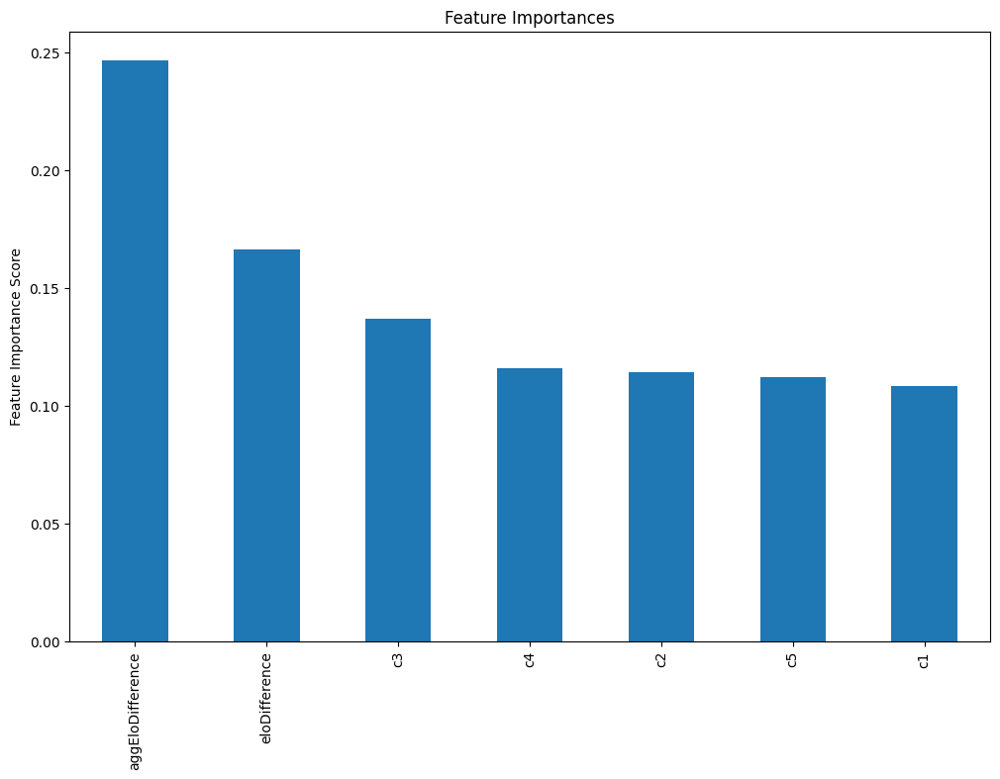

In [143]:
modelfitx(xgb0, X_train, y_train)

In [144]:
from sklearn.model_selection import GridSearchCV


param_test1 = {
    'n_estimators': range(10, 200, 10)
}

gsearch1 = GridSearchCV(
    estimator=xgb.XGBClassifier(
        learning_rate=0.1,
        objective='multi:softprob',
        num_class=3,
        random_state=10,
        #sample_weight=sample_weights,
        use_label_encoder=False,
        eval_metric='mlogloss'
    ),
    param_grid=param_test1,
    scoring='roc_auc_ovr',
    n_jobs=-1,
    cv=5
)

gsearch1.fit(X_train, y_train)

print("Best parameters:", gsearch1.best_params_)
print("Best score:", gsearch1.best_score_)


Best parameters: {'n_estimators': 20}
Best score: 0.6400308281925959


C:\Users\ahmed\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
1 fits failed out of a total of 95.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\ahmed\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\sklearn.py", 

In [145]:
best_n_estimators = gsearch1.best_params_['n_estimators']


In [146]:
param_test2 = {
    'max_depth': range(4, 15, 1),
    'min_child_weight': range(1, 10, 1)
}

gsearch2 = GridSearchCV(
    estimator=xgb.XGBClassifier(
        learning_rate=0.1,
        n_estimators=best_n_estimators,
        objective='multi:softprob',
        num_class=3,
        random_state=10,
        #sample_weight=sample_weights,
        use_label_encoder=False,
        eval_metric='mlogloss'
    ),
    param_grid=param_test2,
    scoring='roc_auc_ovr',
    n_jobs=-1,
    cv=5
)

gsearch2.fit(X_train, y_train)

print("Best parameters:", gsearch2.best_params_)
print("Best score:", gsearch2.best_score_)


Best parameters: {'max_depth': 4, 'min_child_weight': 8}
Best score: 0.6439323652044574


c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:22:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [147]:
best_max_depth = gsearch2.best_params_['max_depth']
best_min_child_weight = gsearch2.best_params_['min_child_weight']


In [148]:
param_test3 = {
    'gamma': [i/10.0 for i in range(0, 5)]
}

gsearch3 = GridSearchCV(
    estimator=xgb.XGBClassifier(
        learning_rate=0.1,
        n_estimators=best_n_estimators,
        max_depth=best_max_depth,
        min_child_weight=best_min_child_weight,
        objective='multi:softprob',
        num_class=3,
        #sample_weight=sample_weights,
        random_state=10,
        use_label_encoder=False,
        eval_metric='mlogloss'
    ),
    param_grid=param_test3,
    scoring='roc_auc_ovr',
    n_jobs=-1,
    cv=5
)

gsearch3.fit(X_train, y_train)

print("Best parameters:", gsearch3.best_params_)
print("Best score:", gsearch3.best_score_)


Best parameters: {'gamma': 0.4}
Best score: 0.6440568948374751


c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:22:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [149]:
best_gamma = gsearch3.best_params_['gamma']


In [150]:
param_test4 = {
    'subsample': [i/10.0 for i in range(2,10)],
    'colsample_bytree': [i/10.0 for i in range(6,10)]
}

gsearch4 = GridSearchCV(
    estimator=xgb.XGBClassifier(
        learning_rate=0.1,
        n_estimators=best_n_estimators,
        max_depth=best_max_depth,
        min_child_weight=best_min_child_weight,
        gamma=best_gamma,
        #sample_weight=sample_weights,
        objective='multi:softprob',
        num_class=3,
        random_state=10,
        use_label_encoder=False,
        eval_metric='mlogloss'
    ),
    param_grid=param_test4,
    scoring='roc_auc_ovr',
    n_jobs=-1,
    cv=5
)

gsearch4.fit(X_train, y_train)

print("Best parameters:", gsearch4.best_params_)
print("Best score:", gsearch4.best_score_)


Best parameters: {'colsample_bytree': 0.6, 'subsample': 0.9}
Best score: 0.6448849476939911


c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:22:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [151]:
best_subsample = gsearch4.best_params_['subsample']
best_colsample_bytree = gsearch4.best_params_['colsample_bytree']


In [152]:
param_test5 = {
    'reg_alpha': [0, 0.001, 0.005, 0.01, 0.05, 0.075, 0.1, 0.5]
}

gsearch5 = GridSearchCV(
    estimator=xgb.XGBClassifier(
        learning_rate=0.1,
        n_estimators=best_n_estimators,
        max_depth=best_max_depth,
        min_child_weight=best_min_child_weight,
        gamma=best_gamma,
        subsample=best_subsample,
        colsample_bytree=best_colsample_bytree,
        objective='multi:softprob',
        num_class=3,
        #sample_weight=sample_weights,
        random_state=10,
        use_label_encoder=False,
        eval_metric='mlogloss'
    ),
    param_grid=param_test5,
    scoring='roc_auc_ovr',
    n_jobs=-1,
    cv=5
)

gsearch5.fit(X_train, y_train)

print("Best parameters:", gsearch5.best_params_)
print("Best score:", gsearch5.best_score_)


Best parameters: {'reg_alpha': 0.5}
Best score: 0.6451198875362318


c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:22:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [153]:
best_reg_alpha = gsearch5.best_params_['reg_alpha']


In [154]:
final_model = xgb.XGBClassifier(
    learning_rate=0.1,
    n_estimators=best_n_estimators,
    max_depth=best_max_depth,
    #sample_weight=sample_weights,
    min_child_weight=best_min_child_weight,
    gamma=best_gamma,
    subsample=best_subsample,
    colsample_bytree=best_colsample_bytree,
    reg_alpha=best_reg_alpha,
    objective='multi:softprob',
    num_class=3,
    random_state=10,
    use_label_encoder=False,
    eval_metric='mlogloss',
    
)

final_model.fit(
    X_train,
    y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    #sample_weight=sample_weights,
    verbose=True
)


c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:22:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	validation_0-mlogloss:1.08490	validation_1-mlogloss:1.08620
[1]	validation_0-mlogloss:1.07220	validation_1-mlogloss:1.07445
[2]	validation_0-mlogloss:1.06155	validation_1-mlogloss:1.06498
[3]	validation_0-mlogloss:1.05095	validation_1-mlogloss:1.05558
[4]	validation_0-mlogloss:1.04266	validation_1-mlogloss:1.04836
[5]	validation_0-mlogloss:1.03471	validation_1-mlogloss:1.04140
[6]	validation_0-mlogloss:1.02894	validation_1-mlogloss:1.03652
[7]	validation_0-mlogloss:1.02266	validation_1-mlogloss:1.03118
[8]	validation_0-mlogloss:1.01744	validation_1-mlogloss:1.02685
[9]	validation_0-mlogloss:1.01286	validation_1-mlogloss:1.02299
[10]	validation_0-mlogloss:1.00900	validation_1-mlogloss:1.01975
[11]	validation_0-mlogloss:1.00590	validation_1-mlogloss:1.01720
[12]	validation_0-mlogloss:1.00272	validation_1-mlogloss:1.01469
[13]	validation_0-mlogloss:1.00007	validation_1-mlogloss:1.01274
[14]	validation_0-mlogloss:0.99763	validation_1-mlogloss:1.01094
[15]	validation_0-mlogloss:0.99561	

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=0.4, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=4,
              max_leaves=None, min_child_weight=8, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=20,
              n_jobs=None, num_class=3, num_parallel_tree=None, ...)

In [155]:
final_model = xgb.XGBClassifier(
    learning_rate=0.001,
    n_estimators=best_n_estimators * 100,
    max_depth=best_max_depth,
    #sample_weight=sample_weights,
    min_child_weight=best_min_child_weight,
    gamma=best_gamma,
    subsample=best_subsample,
    colsample_bytree=best_colsample_bytree,
    reg_alpha=best_reg_alpha,
    objective='multi:softprob',
    num_class=3,
    random_state=10,
    use_label_encoder=False,
    eval_metric='mlogloss',
    
)

final_model.fit(
    X_train,
    y_train,
    eval_set=[(X_train, y_train), (X_test, y_test)],
    #sample_weight=sample_weights,
    verbose=True
)


[0]	validation_0-mlogloss:1.09847	validation_1-mlogloss:1.09848
[1]	validation_0-mlogloss:1.09832	validation_1-mlogloss:1.09834
[2]	validation_0-mlogloss:1.09817	validation_1-mlogloss:1.09821
[3]	validation_0-mlogloss:1.09801	validation_1-mlogloss:1.09806


[4]	validation_0-mlogloss:1.09786	validation_1-mlogloss:1.09792
[5]	validation_0-mlogloss:1.09769	validation_1-mlogloss:1.09777
[6]	validation_0-mlogloss:1.09755	validation_1-mlogloss:1.09764
[7]	validation_0-mlogloss:1.09739	validation_1-mlogloss:1.09749
[8]	validation_0-mlogloss:1.09722	validation_1-mlogloss:1.09734
[9]	validation_0-mlogloss:1.09706	validation_1-mlogloss:1.09719
[10]	validation_0-mlogloss:1.09689	validation_1-mlogloss:1.09704
[11]	validation_0-mlogloss:1.09674	validation_1-mlogloss:1.09690
[12]	validation_0-mlogloss:1.09658	validation_1-mlogloss:1.09675
[13]	validation_0-mlogloss:1.09641	validation_1-mlogloss:1.09660
[14]	validation_0-mlogloss:1.09625	validation_1-mlogloss:1.09645
[15]	validation_0-mlogloss:1.09609	validation_1-mlogloss:1.09630
[16]	validation_0-mlogloss:1.09592	validation_1-mlogloss:1.09615


c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:22:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[17]	validation_0-mlogloss:1.09576	validation_1-mlogloss:1.09600
[18]	validation_0-mlogloss:1.09560	validation_1-mlogloss:1.09585
[19]	validation_0-mlogloss:1.09543	validation_1-mlogloss:1.09570
[20]	validation_0-mlogloss:1.09527	validation_1-mlogloss:1.09555
[21]	validation_0-mlogloss:1.09510	validation_1-mlogloss:1.09540
[22]	validation_0-mlogloss:1.09494	validation_1-mlogloss:1.09526
[23]	validation_0-mlogloss:1.09478	validation_1-mlogloss:1.09511
[24]	validation_0-mlogloss:1.09462	validation_1-mlogloss:1.09496
[25]	validation_0-mlogloss:1.09446	validation_1-mlogloss:1.09481
[26]	validation_0-mlogloss:1.09430	validation_1-mlogloss:1.09467
[27]	validation_0-mlogloss:1.09414	validation_1-mlogloss:1.09452
[28]	validation_0-mlogloss:1.09398	validation_1-mlogloss:1.09437
[29]	validation_0-mlogloss:1.09382	validation_1-mlogloss:1.09422
[30]	validation_0-mlogloss:1.09365	validation_1-mlogloss:1.09408
[31]	validation_0-mlogloss:1.09351	validation_1-mlogloss:1.09394
[32]	validation_0-mloglos

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=0.4, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.001, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=4,
              max_leaves=None, min_child_weight=8, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=2000,
              n_jobs=None, num_class=3, num_parallel_tree=None, ...)

c:\Users\ahmed\AppData\Local\Programs\Python\Python311\Lib\site-packages\xgboost\core.py:158: UserWarning: [12:23:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Model Report
Accuracy : 0.5233
AUC Score (Train): 0.6630669794114709
CV Score : Mean - 0.6443527 | Std - 0.006512162 | Min - 0.6382927 | Max - 0.6565199


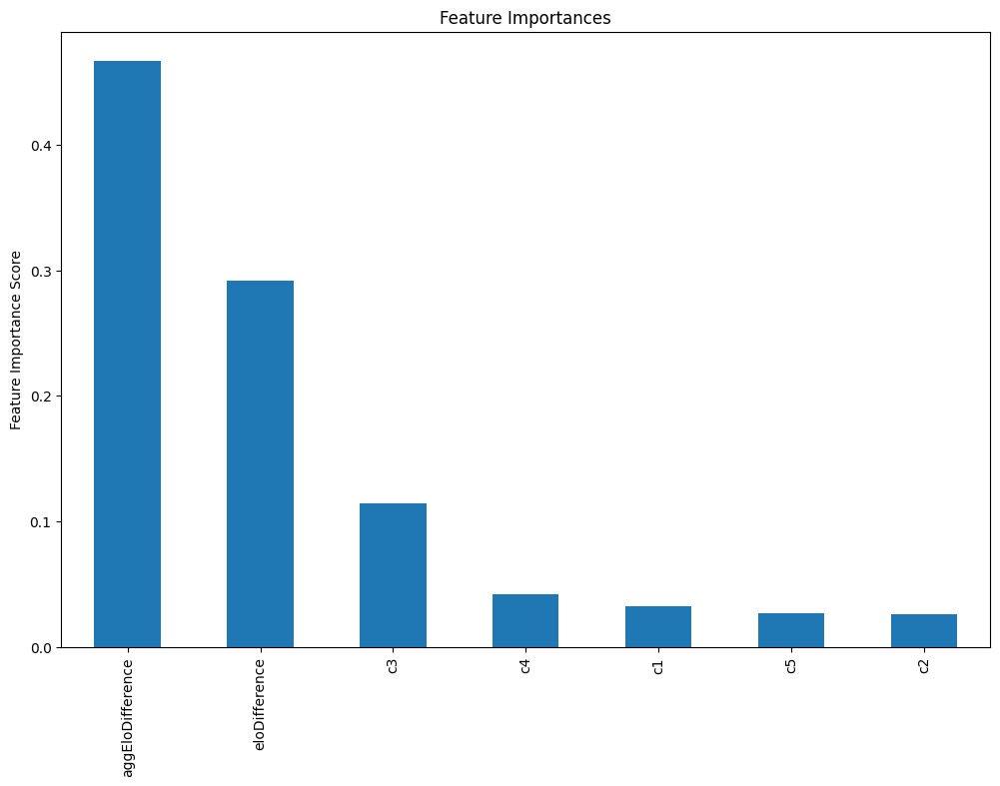

In [156]:
modelfitx(final_model,X_train,y_train)

In [45]:
# Predict on test data
y_pred = final_model.predict(X_test)
y_pred_proba = final_model.predict_proba(X_test)

# Classification report
from sklearn.metrics import classification_report, confusion_matrix

print("Confusion Matrix:")

print(confusion_matrix(y_test, y_pred))

print("Classification Report:")
print(classification_report(y_test, y_pred))

# ROC AUC Score
from sklearn.metrics import roc_auc_score

roc_auc = roc_auc_score(y_test, y_pred_proba, multi_class='ovr')
print(f"ROC AUC Score: {roc_auc}")


Confusion Matrix:
[[2579  439    1]
 [1116  867    1]
 [1247  456    1]]
Classification Report:
              precision    recall  f1-score   support

           0       0.52      0.85      0.65      3019
           1       0.49      0.44      0.46      1984
           2       0.33      0.00      0.00      1704

    accuracy                           0.51      6707
   macro avg       0.45      0.43      0.37      6707
weighted avg       0.47      0.51      0.43      6707

ROC AUC Score: 0.6479955636694144


In [179]:
import json
from botasaurus.request import request, Request
from botasaurus_requests import response
DATE = '2024-10-30'  # You can change this as needed


# Initialize the Botasaurus session
@request(output=None, create_error_logs=False)
def _botasaurus_get(request: Request, url: str) -> response.Response:
    """SofaScore introduced some anti-scraping measures. Using Botasaurus gets around them."""
    if not isinstance(url, str):
        raise TypeError('`url` must be a string.')
    response = request.get(url)
    return response



In [180]:
def fetch_scheduled_events(date):
    url = f'https://www.sofascore.com/api/v1/sport/football/scheduled-events/{date}'
    response = _botasaurus_get(url)
    if response.status_code == 200:
        print(response.json())
        return response.json()
    else:
        print(f"Failed to fetch events for {date}")
        return None

scheduled_events = fetch_scheduled_events(DATE)


{'events': [{'tournament': {'name': 'Serie A', 'slug': 'serie-a', 'category': {'name': 'Italy', 'slug': 'italy', 'sport': {'name': 'Football', 'slug': 'football', 'id': 1}, 'id': 31, 'country': {'alpha2': 'IT', 'alpha3': 'ITA', 'name': 'Italy', 'slug': 'italy'}, 'flag': 'italy', 'alpha2': 'IT'}, 'uniqueTournament': {'name': 'Serie A', 'slug': 'serie-a', 'category': {'name': 'Italy', 'slug': 'italy', 'sport': {'name': 'Football', 'slug': 'football', 'id': 1}, 'id': 31, 'country': {'alpha2': 'IT', 'alpha3': 'ITA', 'name': 'Italy', 'slug': 'italy'}, 'flag': 'italy', 'alpha2': 'IT'}, 'userCount': 755849, 'id': 23, 'hasEventPlayerStatistics': True, 'displayInverseHomeAwayTeams': False}, 'priority': 614, 'id': 33}, 'season': {'name': 'Serie A 24/25', 'year': '24/25', 'editor': False, 'id': 63515}, 'roundInfo': {'round': 10}, 'customId': 'Kdbsueb', 'status': {'code': 100, 'description': 'Ended', 'type': 'finished'}, 'winnerCode': 2, 'homeTeam': {'name': 'Cagliari', 'slug': 'cagliari', 'shortN

In [181]:
# Prepare a list to store event details
events_list = []

if scheduled_events:
    events = scheduled_events.get('events', [])
    for event in events:
        unique_tournament = event.get('tournament', {}).get('uniqueTournament', {})
        unique_tournament_id = unique_tournament.get('id')
        if unique_tournament_id in LEAGUES.values():
            event_id = event.get('id')
            tournament_name = unique_tournament.get('name')
            home_team_id = event.get('homeTeam', {}).get('id')
            away_team_id = event.get('awayTeam', {}).get('id')
            home_team_name = event.get('homeTeam', {}).get('name')
            away_team_name = event.get('awayTeam', {}).get('name')
            home_score = event.get('homeScore', {}).get('display', 0)
            away_score = event.get('awayScore', {}).get('display', 0)
            start_timestamp = event.get("startTimestamp")
            if start_timestamp:
                match_datetime = datetime.fromtimestamp(start_timestamp)
                match_date = match_datetime.strftime("%Y-%m-%d")
                match_time = match_datetime.strftime("%H:%M:%S")
            else:
                match_date = None
                match_time = None
            
            events_list.append({
                'id':event_id,
                'tournament_name': tournament_name,
                'match_date': match_date,
                'match_time':match_time,
                'event_id': event_id,
                'home_team_id': home_team_id,
                'away_team_id': away_team_id,
                'home_team_name': home_team_name,
                'away_team_name': away_team_name,
                'home_score':home_score,
                'away_score':away_score,
            })
else:
    print("No events found.")


In [182]:
def fetch_lineups_and_compute_avg_elo(event_id, team_side):
    url = f'https://www.sofascore.com/api/v1/event/{event_id}/lineups'
    response = _botasaurus_get(url)
    if response.status_code == 200:
        data = response.json()
        # Determine if the team is home or away
        home_team_data = data.get('home', {})
        away_team_data = data.get('away', {})
        
        if team_side == 'home':
            lineup_players = home_team_data.get('players', [])
        else:
            lineup_players = away_team_data.get('players', [])
        
        # Filter players who are not substitutes
        starting_players = [player for player in lineup_players if not player.get('substitute', False)]
        # Get player IDs
        player_ids = [player.get('player', {}).get('id') for player in starting_players if player.get('player', {}).get('id') is not None]
        # Ensure player IDs are integers
        player_ids = [int(pid) for pid in player_ids]
        
        # Make sure the index of player_elo_df is of integer type
        player_elo_df.index = player_elo_df.index.astype(int)
        
        # Filter the DataFrame using the index
        elos = player_elo_df.loc[player_elo_df.index.isin(player_ids), 'elo'].tolist()
        if elos:
            avg_elo = sum(elos) / len(elos)
            return avg_elo
        else:
            print(f"No ELO ratings found for players in event {event_id}")
            return None
    else:
        print(f"Failed to fetch lineups for event {event_id}")
        return None


In [183]:
import csv
for event in tqdm(events_list, desc="Processing Events"):
    try:
        event_id = event['id']
        home_team = event['home_team_name']
        home_team_id = event['home_team_id']
        away_team = event['away_team_name']
        away_team_id = event['away_team_id']
        home_score = event['home_score']
        away_score = event['away_score']
        gd = home_score - away_score

        # Convert timestamp to readable date and time
        start_timestamp = event.get("startTimestamp")
        if start_timestamp:
            match_datetime = datetime.fromtimestamp(start_timestamp)
            match_date = match_datetime.strftime("%Y-%m-%d")
            match_time = match_datetime.strftime("%H:%M:%S")
        else:
            match_date = None
            match_time = None

        # Initialize team ELOs if not present
        if home_team_id not in team_elo_df.index:
            initialize_team_elo(home_team_id, home_team, elo=1500, date=match_date)

        if away_team_id not in team_elo_df.index:
            initialize_team_elo(away_team_id, away_team, elo=1500, date=match_date)

        # Scrape player match stats
        match_player_data = ss.scrape_player_match_stats(event_id)

        # Initialize missing players
        player_ids = match_player_data['id'].unique()
        missing_player_ids = [pid for pid in player_ids if pid not in player_elo_df.index]

        if missing_player_ids:
            missing_players = match_player_data[match_player_data['id'].isin(missing_player_ids)]
            for _, player in missing_players.iterrows():
                player_id = player['id']
                player_name = player['name']
                player_position = player['position']
                team_id = player['teamId']
                # Initialize missing player with default ELO of 1300
                initialize_player_elo(player_id, player_name, team_id, player_position, elo=1300, date=match_date)
            logging.info(f"Initialized {len(missing_player_ids)} new players with default ELO of 1300.")

        # Aggregate team ELOs
        agg_home_elo = aggregate_team_elo(home_team_id, match_player_data)
        agg_away_elo = aggregate_team_elo(away_team_id, match_player_data)

        # Update player ELOs
        for index, player in match_player_data.iterrows():
            player_id = player['id']
            player_name = player['name']
            player_rating = player['rating']
            player_position = player['position']
            minutes_played = player['minutesPlayed']
            team_id = player['teamId']



            # Update ELO based on team
            if team_id == home_team_id:
                update_player_elo(
                    agg_elo_home=agg_home_elo,
                    agg_elo_away=agg_away_elo,
                    total_home_wins=total_home_wins,
                    total_away_wins=total_away_wins,
                    total_matches=total_matches,
                    gd=gd,
                    player_id=player_id,
                    rating=player_rating,
                    minutes_played=minutes_played,
                    position=player_position,
                    U=0.8,
                    K=30,
                    sc=600,
                    away=False
                )
            elif team_id == away_team_id:
                update_player_elo(
                    agg_elo_home=agg_home_elo,
                    agg_elo_away=agg_away_elo,
                    total_home_wins=total_home_wins,
                    total_away_wins=total_away_wins,
                    total_matches=total_matches,
                    gd=gd,
                    player_id=player_id,
                    rating=player_rating,
                    minutes_played=minutes_played,
                    position=player_position,
                    U=0.8,
                    K=30,
                    sc=600,
                    away=True
                )

        # Update team ELOs and match outcomes
        if home_team not in elo_ratings_mov:
            elo_ratings_mov[home_team] = 1500
        if away_team not in elo_ratings_mov:
            elo_ratings_mov[away_team] = 1500

        homeElo, awayElo = davidson_mov(
            home_team,
            away_team,
            gd,
            elo_ratings_mov,
            total_home_wins,
            total_away_wins,
            total_matches
        )

        # Determine match outcome and update wins
        if gd == 0:
            FTR = 3
            home_outcome = 0
            away_outcome = 0
        elif gd > 0:
            FTR = 1
            total_home_wins += 1
            home_outcome = 1
            away_outcome = -1
        elif gd < 0:
            FTR = 2
            home_outcome = -1
            away_outcome = 1
            total_away_wins += 1

        total_matches += 1

        # Scrape team match stats
        match_data = ss.scrape_team_match_stats(event_id)

        # Prepare match data for saving
        new_row = {
            "eventId": event_id,
            "homeId": home_team_id,
            "homeTeam": home_team,
            "awayId": away_team_id,
            "awayTeam": away_team,
            "homeElo": homeElo,
            "awayElo": awayElo,
            "homeAggElo": agg_home_elo,
            "awayAggElo": agg_away_elo,
            "homeScore": home_score,
            "awayScore": away_score,
            "FTR": FTR,
            "date": match_date,
            "time": match_time
        }

        match_data_filtered = match_data[['key', 'home', 'away']]

        for index, row in match_data_filtered.iterrows():
            key = row['key']
            new_row[f'home{key}'] = row['home']
            new_row[f'away{key}'] = row['away']

        # Append the new_row to the matches CSV file directly
        matches_file_exists = os.path.isfile('matches_data_testrun.csv')
        with open('matches_data_testrun.csv', 'a', newline='') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=new_row.keys())
            if not matches_file_exists:
                writer.writeheader()
            writer.writerow(new_row)

        # Save player match data and team match data to CSV
        filename_players = os.path.join(output_dir_players, f'{event_id}.csv')
        match_player_data.to_csv(filename_players, index=False)
        filename_matches = os.path.join(output_dir_matches, f'{event_id}.csv')
        match_data.to_csv(filename_matches, index=False)

    except Exception as e:
        logging.error(f"Error processing event {event.get('id', 'Unknown')}: {e}", exc_info=True)
        continue

    #time.sleep(0.5)

# After processing all events, save the updated player and team ELO DataFrames
player_elo_df.to_csv(player_elo_csv, index_label='player_id')
team_elo_df.to_csv(team_elo_csv, index_label='team_id')
logging.info(f"Final player ELO data saved to {player_elo_csv}.")


Processing Events:   0%|          | 0/36 [00:00<?, ?it/s]

DEBUG:root:Aggregated ELO for team ID 2719: 1460.4869489752218
DEBUG:root:Aggregated ELO for team ID 2685: 1640.571910135015
Processing Events:   3%|▎         | 1/36 [00:00<00:12,  2.82it/s]DEBUG:root:Aggregated ELO for team ID 2689: 1426.680056246531
DEBUG:root:Aggregated ELO for team ID 2701: 1444.0703543692364
Processing Events:   6%|▌         | 2/36 [00:00<00:10,  3.33it/s]DEBUG:root:Aggregated ELO for team ID 2692: 1780.142953858066
DEBUG:root:Aggregated ELO for team ID 2714: 2008.785770495251
Processing Events:   8%|▊         | 3/36 [00:00<00:09,  3.62it/s]DEBUG:root:Aggregated ELO for team ID 2705: 1426.4667572222597
DEBUG:root:Aggregated ELO for team ID 2697: 2101.635430812331
Processing Events:  11%|█         | 4/36 [00:01<00:09,  3.43it/s]DEBUG:root:Aggregated ELO for team ID 2688: 1389.0519877887084
DEBUG:root:Aggregated ELO for team ID 2695: 1447.375933286416
Processing Events:  14%|█▍        | 5/36 [00:01<00:08,  3.72it/s]DEBUG:root:Aggregated ELO for team ID 2686: 1828.09

In [184]:
DATE = '2024-11-03'  # You can change this as needed
scheduled_events = fetch_scheduled_events(DATE)

{'events': [{'tournament': {'name': 'Premier League', 'slug': 'premier-league', 'category': {'name': 'England', 'slug': 'england', 'sport': {'name': 'Football', 'slug': 'football', 'id': 1}, 'id': 1, 'country': {'alpha2': 'EN', 'alpha3': 'ENG', 'name': 'England', 'slug': 'england'}, 'flag': 'england', 'alpha2': 'EN'}, 'uniqueTournament': {'name': 'Premier League', 'slug': 'premier-league', 'category': {'name': 'England', 'slug': 'england', 'sport': {'name': 'Football', 'slug': 'football', 'id': 1}, 'id': 1, 'country': {'alpha2': 'EN', 'alpha3': 'ENG', 'name': 'England', 'slug': 'england'}, 'flag': 'england', 'alpha2': 'EN'}, 'userCount': 1421079, 'id': 17, 'hasEventPlayerStatistics': True, 'displayInverseHomeAwayTeams': False}, 'priority': 616, 'id': 1}, 'season': {'name': 'Premier League 24/25', 'year': '24/25', 'editor': False, 'id': 61627}, 'roundInfo': {'round': 10}, 'customId': 'Ardc', 'status': {'code': 100, 'description': 'Ended', 'type': 'finished'}, 'winnerCode': 1, 'homeTeam'

In [185]:
with open('my_dict.pkl', 'rb') as f:
    team_clusters = pickle.load(f)

In [186]:
cluster_confidence_cols = [f'cluster_confidence_{i}' for i in range(1, 6)]

In [187]:

# Prepare a list to store event details
events_list = []

if scheduled_events:
    events = scheduled_events.get('events', [])
    for event in events:
        unique_tournament = event.get('tournament', {}).get('uniqueTournament', {})
        unique_tournament_id = unique_tournament.get('id')
        unique_tournament_name = unique_tournament.get('name')
        print(unique_tournament_name, ': ' , unique_tournament_id)
        if unique_tournament_id in LEAGUES.values():
            event_id = event.get('id')
            tournament_name = unique_tournament.get('name')
            print(tournament_name)
            home_team_id = event.get('homeTeam', {}).get('id')
            away_team_id = event.get('awayTeam', {}).get('id')
            home_team_name = event.get('homeTeam', {}).get('name')
            away_team_name = event.get('awayTeam', {}).get('name')
            home_score = event.get('homeScore', {}).get('display', 0)
            away_score = event.get('awayScore', {}).get('display', 0)
            start_timestamp = event.get("startTimestamp")
            if start_timestamp:
                match_datetime = datetime.fromtimestamp(start_timestamp)
                match_date = match_datetime.strftime("%Y-%m-%d")
                match_time = match_datetime.strftime("%H:%M:%S")
            else:
                match_date = None
                match_time = None



            events_list.append({
                'id': event_id,
                'tournament_name': tournament_name,
                'match_date': match_date,
                'match_time': match_time,
                'event_id': event_id,
                'home_team_id': home_team_id,
                'away_team_id': away_team_id,
                'home_team_name': home_team_name,
                'away_team_name': away_team_name,
                'home_score': home_score,
                'away_score': away_score,

            })
else:
    print("No events found.")

Premier League :  17
Premier League
Premier League :  17
Premier League
Premier League :  17
Premier League
Premier League :  17
Premier League
Premier League :  17
Premier League
Premier League :  17
Premier League
Premier League :  17
Premier League
Premier League :  17
Premier League
Premier League :  17
Premier League
LaLiga :  8
LaLiga
LaLiga :  8
LaLiga
LaLiga :  8
LaLiga
LaLiga :  8
LaLiga
LaLiga :  8
LaLiga
LaLiga :  8
LaLiga
LaLiga :  8
LaLiga
LaLiga :  8
LaLiga
Serie A :  23
Serie A
Serie A :  23
Serie A
Serie A :  23
Serie A
Serie A :  23
Serie A
Serie A :  23
Serie A
Serie A :  23
Serie A
Serie A :  23
Serie A
Bundesliga :  35
Bundesliga
Bundesliga :  35
Bundesliga
Bundesliga :  35
Bundesliga
Bundesliga :  35
Bundesliga
Bundesliga :  35
Bundesliga
Bundesliga :  35
Bundesliga
Bundesliga :  35
Bundesliga
Bundesliga :  35
Bundesliga
Ligue 1 :  34
Ligue 1
Ligue 1 :  34
Ligue 1
Ligue 1 :  34
Ligue 1
Ligue 1 :  34
Ligue 1
Ligue 1 :  34
Ligue 1
Ligue 1 :  34
Ligue 1
Ligue 1 :  34


In [188]:
filename = 'elo_dict.pkl'
with open(filename, 'rb') as file:
    elo_ratings_mov = pickle.load(file)



In [189]:
# Prepare a list to store features for the model
model_features = []

for event in events_list:
    tournament_name = event['tournament_name']
    event_id = event['event_id']
    home_team_id = event['home_team_id']
    away_team_id = event['away_team_id']
    home_team_name = event['home_team_name']
    away_team_name = event['away_team_name']
    home_cluster = event.get('home_cluster')
    away_cluster = event.get('away_cluster')

    match_date = event['match_date']
    match_time = event['match_time']
    
    # Get team ELOs
    home_team_elo = elo_ratings_mov.get(home_team_id)
    away_team_elo = elo_ratings_mov.get(away_team_id)

    # Skip if team ELOs are not available
    if home_team_elo is None:
        home_team_elo = 1300
    if away_team_elo is None:
        away_team_elo = 1300
        print(f"ELO not found for teams: {home_team_name} or {away_team_name}")
        continue


    # Get average player ELOs
    home_avg_player_elo = fetch_lineups_and_compute_avg_elo(event_id, 'home')
    away_avg_player_elo = fetch_lineups_and_compute_avg_elo(event_id, 'away')

    # Skip if player ELOs are not available
    if home_avg_player_elo is None or away_avg_player_elo is None:
        print(f"Player ELOs not found for event {event_id} {home_team_name}")
        continue


    if home_team_id in teams_df['teamId'].values:
        home_confidences = teams_df[teams_df['teamId'] == int(home_team_id)][cluster_confidence_cols]
    else:
        # Set to zero array if not found
        home_confidences = pd.Series([0]*5, index=cluster_confidence_cols)
        print(f"Home team ID {home_team_id} {home_team_name} not found in teams DataFrame.")

    # Retrieve cluster confidences for the away team
    if away_team_id in teams_df['teamId'].values:
        away_confidences = teams_df[teams_df['teamId'] == away_team_id][cluster_confidence_cols]
    else:
        # Set to zero array if not found
        away_confidences = pd.Series([0]*5, index=cluster_confidence_cols)
        print(f"Away team ID {away_team_name} not found in teams DataFrame.")


    
    confidences_diff = home_confidences.values - away_confidences.values
    print(confidences_diff[0])
    c1 = confidences_diff[0][0]
    c2 = confidences_diff[0][1]
    c3 = confidences_diff[0][2]
    c4 = confidences_diff[0][3]
    c5 = confidences_diff[0][4]


    
    # Store features, including clusters
    model_features.append({
        'tournament_name': tournament_name,
        'date': match_date,
        'time': match_time,
        'home_team_name': home_team_name,
        'away_team_name': away_team_name,
        'eloDifference': home_team_elo - away_team_elo,
        'aggEloDifference': home_avg_player_elo - away_avg_player_elo,
        'c1':c1,
        'c2':c2,
        'c3':c3,
        'c4':c4,
        'c5':c5,
    })



[ 0.15122121 -0.19990484 -0.0138747   0.01045577  0.05210257]
[ 0.09414277 -0.04976172 -0.05456695 -0.04760788  0.05779379]
[ 0.09200861 -0.23447455  0.02001572  0.10730608  0.01514414]
[-0.07334902  0.03265913  0.03354981  0.01239924 -0.00525917]
[ 0.125963   -0.08104568 -0.01338949  0.00788776 -0.0394156 ]
[-0.04055218  0.09282733  0.00318089  0.00424265 -0.05969869]
[ 0.08050471  0.02770997 -0.01204833  0.00696847 -0.10313481]
[-0.1689191   0.21152334  0.01060269 -0.01555024 -0.03765669]
[-0.00137595  0.06162533 -0.02445636 -0.02010866 -0.01568436]
[ 0.08400318  0.0263079   0.00180209  0.01591866 -0.12803183]
[-0.09600364  0.11970128  0.03565044 -0.01759781 -0.04175028]
Failed to fetch lineups for event 12437651
Failed to fetch lineups for event 12437651
Player ELOs not found for event 12437651 Villarreal
Failed to fetch lineups for event 12437653
Failed to fetch lineups for event 12437653
Player ELOs not found for event 12437653 Valencia
[-0.02456126  0.14993905 -0.01725445 -0.1105

In [190]:
df_model = pd.DataFrame(model_features)

In [191]:
df_model

,tournament_name,date,time,home_team_name,away_team_name,eloDifference,aggEloDifference,c1,c2,c3,c4,c5
0,Premier League,2024-11-02,12:30:00,Newcastle United,Arsenal,254.312188,-239.963312,0.151221,-0.199905,-0.013875,0.010456,0.052103
1,Premier League,2024-11-02,15:00:00,Bournemouth,Manchester City,-1114.775130,-624.198643,0.094143,-0.049762,-0.054567,-0.047608,0.057794
2,Premier League,2024-11-02,15:00:00,Ipswich Town,Leicester City,-120.258981,-170.200681,0.092009,-0.234475,0.020016,0.107306,0.015144
3,Premier League,2024-11-02,15:00:00,Liverpool,Brighton & Hove Albion,-419.189228,440.694553,-0.073349,0.032659,0.033550,0.012399,-0.005259
4,Premier League,2024-11-02,15:00:00,Nottingham Forest,West Ham United,-126.261308,-105.488674,0.125963,-0.081046,-0.013389,0.007888,-0.039416
5,Premier League,2024-11-02,15:00:00,Southampton,Everton,-184.375256,-79.515188,-0.040552,0.092827,0.003181,0.004243,-0.059699
6,Premier League,2024-11-02,17:30:00,Wolverhampton,Crystal Palace,-428.147721,-104.166739,0.080505,0.027710,-0.012048,0.006968,-0.103135
7,Premier League,2024-11-03,14:00:00,Tottenham Hotspur,Aston Villa,370.281505,-12.628710,-0.168919,0.211523,0.010603,-0.015550,-0.037657
8,Premier League,2024-11-03,16:30:00,Manchester United,Chelsea,-215.726944,178.661153,-0.001376,0.061625,-0.024456,-0.020109,-0.015684
9,LaLiga,2024-11-02,13:00:00,Osasuna,Real Valladolid,133.409325,244.942343,0.084003,0.026308,0.001802,0.015919,-0.128032


In [192]:
# Select features for prediction
columns_to_keep = ['eloDifference','aggEloDifference', 'c1','c2','c3','c4','c5']
features = df_model[columns_to_keep]

# Make predictions
predictions = final_model.predict(features)
probabilities = final_model.predict_proba(features)

# Add predictions to the DataFrame
df_model['prediction'] = predictions
df_model['predicted_winner_probability'] = probabilities.max(axis=1)  # Assuming you want the highest probability
df_model['prob_home_win'] = probabilities[:, 0]  # Probability for Home Win (class 0)
df_model['prob_away_win'] = probabilities[:, 1]  # Probability for Away Win (class 1)
df_model['prob_draw'] = probabilities[:, 2]      # Probability for Draw (class 2)


In [193]:
import pandas as pd

# Initialize an empty list to store match results
match_results = []

for idx, row in df_model.iterrows():
    tournament_name = row['tournament_name']
    date = row['date']
    time = row['time']
    home_team = row['home_team_name']
    away_team = row['away_team_name']
    prediction = row['prediction']
    probability = row['predicted_winner_probability']
    prob_home_win = row['prob_home_win']
    prob_away_win = row['prob_away_win']
    prob_draw = row['prob_draw']
    
    
    # Determine the result based on the prediction
    if prediction == 0:
        winner = home_team
    elif prediction == 1:
        winner = away_team
    elif prediction == 2:
        winner = 'DRAW'
    else:
        winner = 'Unknown result'
    
    # Print match and result
    print(f"Match: {home_team} vs {away_team}")
    print(f"Winner: {winner} with probability {probability:.2f}")
    print("-" * 30)
    
    if date == DATE:
        # Append the result to the list
        match_results.append({
            'tournament_name':tournament_name,
            'date': date,
            'time':time,
            'home_team': home_team,
            'away_team': away_team,
            'winner': winner,
            'probability': probability,
            'prob_home_win': prob_home_win,
            'prob_away_win': prob_away_win,
            'prob_draw': prob_draw
        })
    else:
        pass

# Convert the list of dictionaries to a DataFrame
results_df = pd.DataFrame(match_results)

# Save the original results to a CSV file
results_df.to_csv('match_predictions.csv', index=False)

# **Sort the DataFrame by 'probability' in descending order**
sorted_results_df = results_df.sort_values(by='probability', ascending=False)

# Save the sorted DataFrame to a new CSV file
sorted_results_df.to_csv('match_predictions_sorted_by_probability.csv', index=False)

print("Match results have been saved to 'match_predictions.csv'.")
print("Sorted match results have been saved to 'match_predictions_sorted_by_probability.csv'.")


Match: Newcastle United vs Arsenal
Winner: Newcastle United with probability 0.38
------------------------------
Match: Bournemouth vs Manchester City
Winner: Manchester City with probability 0.51
------------------------------
Match: Ipswich Town vs Leicester City
Winner: Leicester City with probability 0.36
------------------------------
Match: Liverpool vs Brighton & Hove Albion
Winner: Liverpool with probability 0.44
------------------------------
Match: Nottingham Forest vs West Ham United
Winner: Nottingham Forest with probability 0.36
------------------------------
Match: Southampton vs Everton
Winner: Southampton with probability 0.38
------------------------------
Match: Wolverhampton vs Crystal Palace
Winner: Crystal Palace with probability 0.39
------------------------------
Match: Tottenham Hotspur vs Aston Villa
Winner: Tottenham Hotspur with probability 0.46
------------------------------
Match: Manchester United vs Chelsea
Winner: Manchester United with probability 0.44


4142